# Przygotowanie 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install shap
!pip install SAlib
!pip install sklearn-relief

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 575 kB 6.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 758 kB 7.4 MB/s 
     |████████████████████████████████| 132 kB 49.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# importy ogólne
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from timeit import default_timer as timer
from IPython.display import clear_output
from IPython.display import display, HTML
import pickle
import shap

# importy do modeli regresji
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression

# importy do sieci neuronowych keras
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

In [4]:
display(HTML("<style>.container { width:80% !important; }</style>"))

# Analiza danych wypożyczeń dla godzin

In [ ]:
data_hour = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DataSets/BikeDataset_hour.csv')

In [ ]:
print( data_hour.isnull().sum() )

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64


        cnt
yr         
0   1243103
1   2049576


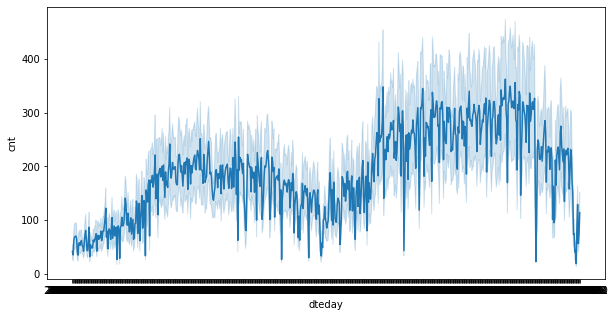

In [ ]:
plt.figure( figsize=(10, 5) )
sns.lineplot(data=data_hour, x='dteday', y='cnt')
print( data_hour[['cnt', 'yr']].groupby('yr').sum() )

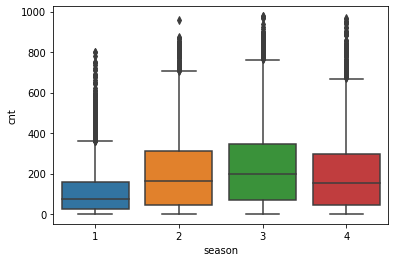

In [ ]:
sns.boxplot( data=data_hour, x='season', y='cnt')

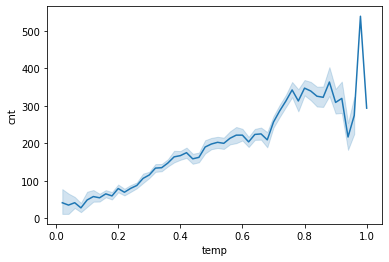

In [ ]:
sns.lineplot(data=data_hour, x='temp', y='cnt')

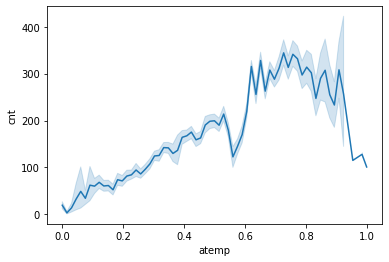

In [ ]:
sns.lineplot(data=data_hour, x='atemp', y='cnt')

In [ ]:
print( data_hour.head() )

   instant      dteday  season  yr  mnth  hr  holiday  weekday  workingday  \
0        1  2011-01-01       1   0     1   0        0        6           0   
1        2  2011-01-01       1   0     1   1        0        6           0   
2        3  2011-01-01       1   0     1   2        0        6           0   
3        4  2011-01-01       1   0     1   3        0        6           0   
4        5  2011-01-01       1   0     1   4        0        6           0   

   weathersit  temp   atemp   hum  windspeed  casual  registered  cnt  
0           1  0.24  0.2879  0.81        0.0       3          13   16  
1           1  0.22  0.2727  0.80        0.0       8          32   40  
2           1  0.22  0.2727  0.80        0.0       5          27   32  
3           1  0.24  0.2879  0.75        0.0       3          10   13  
4           1  0.24  0.2879  0.75        0.0       0           1    1  


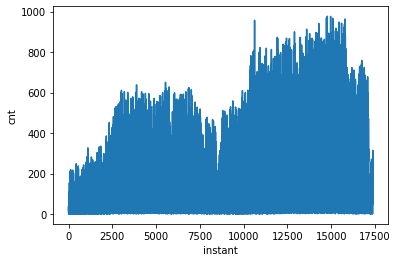

In [ ]:
sns.lineplot(data=data_hour, x='instant', y='cnt')

In [ ]:
timesplit = TimeSeriesSplit(n_splits=8)
X_Y = data_hour.drop(['instant', 'dteday', 'casual', 'registered'], axis=1)
print( data_hour.head() )

   instant      dteday  season  yr  mnth  hr  holiday  weekday  workingday  \
0        1  2011-01-01       1   0     1   0        0        6           0   
1        2  2011-01-01       1   0     1   1        0        6           0   
2        3  2011-01-01       1   0     1   2        0        6           0   
3        4  2011-01-01       1   0     1   3        0        6           0   
4        5  2011-01-01       1   0     1   4        0        6           0   

   weathersit  temp   atemp   hum  windspeed  casual  registered  cnt  
0           1  0.24  0.2879  0.81        0.0       3          13   16  
1           1  0.22  0.2727  0.80        0.0       8          32   40  
2           1  0.22  0.2727  0.80        0.0       5          27   32  
3           1  0.24  0.2879  0.75        0.0       3          10   13  
4           1  0.24  0.2879  0.75        0.0       0           1    1  


# Modele Randomowych lasów (godzinnie)

In [ ]:
# time series for random forest
rmse = []
forest_models = []
separation_index = []

for train_index, test_index in timesplit.split(X_Y):
    all_train = X_Y.iloc[train_index]
    all_test = X_Y.iloc[test_index]
    x_train = all_train.drop('cnt', axis=1)
    y_train = all_train['cnt']
    x_test = all_train.drop('cnt', axis=1)
    y_test = all_train['cnt']
    
    rforest = RandomForestRegressor(n_estimators=500)
    rforest.fit( x_train.values, y_train.values )
    y_pred = rforest.predict(x_test.values)
    rmse.append( mean_squared_error(y_test.values, y_pred) )
    forest_models.append(rforest)
    separation_index.append(train_index.max())
    
print( rmse )

[48.03392794407043, 113.54522355981356, 144.33297370594022, 151.65607962793948, 164.21583209981816, 180.50881885724678, 202.09682236577117, 219.5399704086643]


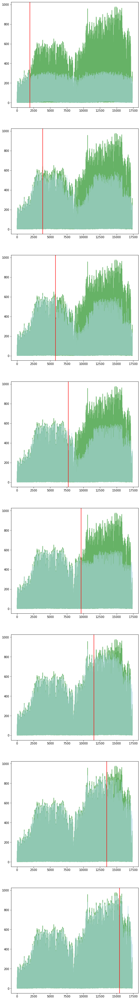

In [ ]:
# wizualizacja dopasowania dla zwiekszajacej sie proby uczacej gdzie linia pokazuje separacje danych
y_real = data_hour['cnt'].values
x = data_hour['instant'].values
    
fig, ax = plt.subplots(len(forest_models), figsize = (8, len(forest_models) * 8) )
for i in range(len(forest_models)):
    x_pred = data_hour.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = forest_models[i].predict(x_pred)
    ax[i].plot(x, y_real, color='green', alpha=0.6)
    ax[i].plot(x, y_pred, color='lightblue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='red', label='axvline - full height')

# Modele MLP (godzinnie)

In [ ]:
# creating models list
nn_model = Sequential()
nn_model.add( Dense(24, input_dim=12, activation='relu') )
nn_model.add( Dense(16, activation='relu') )
nn_model.add( Dense(16, activation='linear') )
nn_model.add( Dense(16, activation='linear') )
nn_model.add( Dense(1, activation='relu') )

nn_models = []
separation_index = []
for  train_index, test_index in timesplit.split(X_Y):
    nn_models.append( keras.models.clone_model(nn_model) )
    separation_index.append(train_index.max())

In [ ]:
i = 0
for train_index, test_index in timesplit.split(X_Y):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1), train['cnt']
    x_test, y_test = test.drop('cnt', axis=1), test['cnt']
    early_stop = EarlyStopping(monitor='val_loss', patience=25, mode='min')
    
    nn_models[i].compile(optimizer='adam', loss='mse')
    nn_models[i].fit(
                     x_train,
                     y_train.ravel(),
                     batch_size=64,
                     epochs = 1500,
                     verbose = 0,
                     validation_data=(x_test, y_test),
                     callbacks=[early_stop]
                    )
    print(f"{i} model trained")
    i += 1

0 model trained
1 model trained
2 model trained
3 model trained
4 model trained
5 model trained
6 model trained
7 model trained


544/544 [==============================] - 1s 984us/step


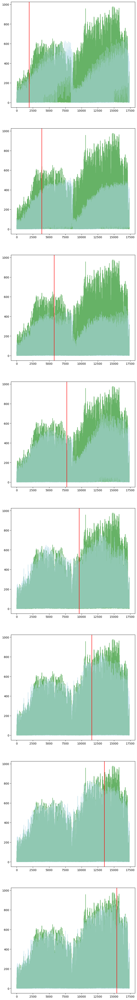

In [ ]:
# wizualizacja dopasowania dla zwiekszajacej sie proby uczacej gdzie linia pokazuje separacje danych
y_real = data_hour['cnt'].values
x = data_hour['instant'].values
    
fig, ax = plt.subplots(len(nn_models), figsize = (8, len(nn_models) * 8) )
for i in range(len(nn_models)):
    x_pred = data_hour.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = nn_models[i].predict(x_pred)
    ax[i].plot(x, y_real, color='green', alpha=0.6)
    ax[i].plot(x, y_pred, color='lightblue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='red', label='axvline - full height')

# Modele SVM (godzinnie)

In [ ]:
# creating svm models for fitting
svm_models = []
grid_param = { 'C':[1, 10, 100, 1000], 'gamma' : ['auto'], 'epsilon' : [1, 0.1, 0.01, 0.001],  'kernel': ['rbf']}

for train_index, test_index in timesplit.split(X_Y):
    svm_models.append( GridSearchCV(SVR(), grid_param, refit=True, verbose=0, n_jobs=-1) )


In [ ]:
i = 0
for train_index, test_index in timesplit.split(X_Y):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1), train['cnt']
    x_test, y_test = test.drop('cnt', axis=1), test['cnt']
    svm_models[i].fit(x_train.values, y_train.values)
    print(f" {i} model fitted ")
    i += 1

In [ ]:
y_real = data_hour['cnt'].values
x = data_hour['instant'].values
    
fig, ax = plt.subplots(len(svm_models), figsize = (8, len(svm_models) * 8) )
for i in range(len(svm_models)):
    x_pred = data_hour.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = svm_models[i].predict(x_pred)
    ax[i].plot(x, y_real, color='green', alpha=0.6)
    ax[i].plot(x, y_pred, color='lightblue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='red', label='axvline - full height')

In [ ]:
# printing best params for svm_models
for model in svm_models:
  print(model.best_params_)

# **Analiza danych dla dziennych wypożyczeń**


In [5]:
data_day =  pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DataSets/BikeDataset_day.csv')
print( data_day.info() )
print( data_day.head(3) )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB
None
   instant      dteday  season  yr  mnth  holiday  weekday  workingday  \
0        1  20

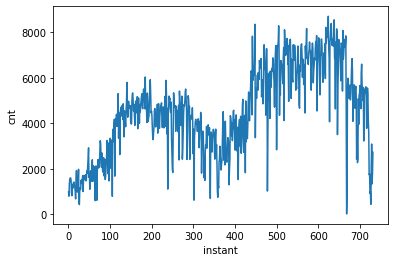

In [ ]:
sns.lineplot(data=data_day, x='instant', y='cnt')

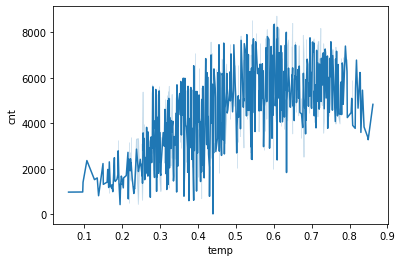

In [ ]:
sns.lineplot(data=data_day, x='temp', y='cnt')

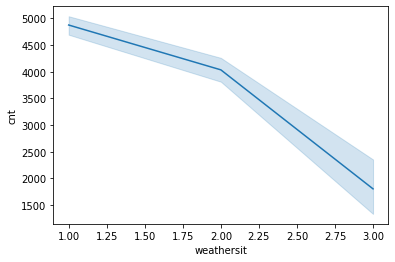

In [8]:
sns.lineplot(data=data_day, x='weathersit', y='cnt')

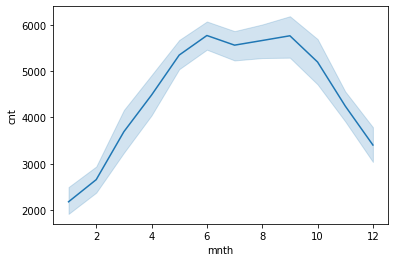

In [ ]:
sns.lineplot(data=data_day, x='mnth', y='cnt')

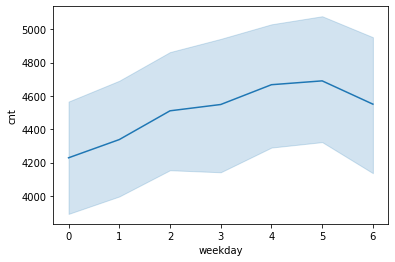

In [ ]:
sns.lineplot(data=data_day, x='weekday', y='cnt')

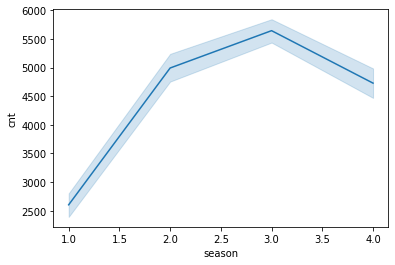

In [9]:
sns.lineplot(data=data_day, x='season', y='cnt')

In [ ]:
timesplit = TimeSeriesSplit(n_splits=8)
X_Y = data_day.drop(['instant', 'dteday', 'casual', 'registered'], axis=1)


print(X_Y.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      731 non-null    int64  
 1   yr          731 non-null    int64  
 2   mnth        731 non-null    int64  
 3   holiday     731 non-null    int64  
 4   weekday     731 non-null    int64  
 5   workingday  731 non-null    int64  
 6   weathersit  731 non-null    int64  
 7   temp        731 non-null    float64
 8   atemp       731 non-null    float64
 9   hum         731 non-null    float64
 10  windspeed   731 non-null    float64
 11  cnt         731 non-null    int64  
dtypes: float64(4), int64(8)
memory usage: 68.7 KB
None


# Modele Drzew decyzyjnych (dziennie)

In [ ]:
# time series for dtree
rmse = []
mae = []
avg = []
models = []
separation_index = []

for train_index, test_index in timesplit.split(X_Y):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1), train['cnt']
    x_test, y_test = test.drop('cnt', axis=1), test['cnt']
    
    dtree = DecisionTreeRegressor()
    dtree.fit( x_train.values, y_train.values )
    y_pred = dtree.predict(x_test.values)
    
    rmse.append( np.sqrt(mean_squared_error(y_test.values, y_pred)) )
    mae.append( mean_absolute_error(y_test, y_pred) )
    avg.append( np.mean(y_test.values) )
    models.append(dtree)
    separation_index.append(train_index.max())

print( f'Dla trzeciego od końca modelu:\nrmse: {rmse[-3]}\nmae: {mae[-3]}\nśrednia ilość wyporzyczeń: {avg[-3]}') 

Dla trzeciego od końca modelu:
rmse: 1000.5492072104114
mae: 799.5555555555555
średnia ilość wyporzyczeń: 6497.456790123457


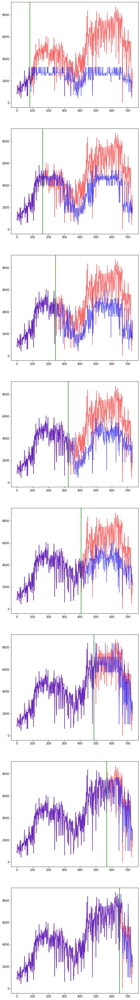

In [ ]:
# wizualizacja predykcji dla całego zbioru danych z widocznym podziałem danych uczących
y_real = data_day['cnt'].values
x = data_day['instant'].values
    
fig, ax = plt.subplots(len(models), figsize = (8, len(models) * 8) )
for i, model in enumerate(models):
    x_pred = data_day.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = model.predict(x_pred)
    ax[i].plot(x, y_real, color='red', alpha=0.6)
    ax[i].plot(x, y_pred, color='blue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='green', label='axvline - full height')

In [ ]:
pickle.dump(models[-3], open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_DTREE.sav', 'wb'))

# Modele Randomowych lasów (dziennie)

In [ ]:
# time series for random forest
rmse = []
mae = []
avg = []
models = []
separation_index = []

for train_index, test_index in timesplit.split(X_Y):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1), train['cnt']
    x_test, y_test = test.drop('cnt', axis=1), test['cnt']
    
    rforest = RandomForestRegressor(n_estimators=500)
    rforest.fit( x_train.values, y_train.values )
    y_pred = rforest.predict(x_test.values)
    
    rmse.append( np.sqrt(mean_squared_error(y_test.values, y_pred)) )
    mae.append( mean_absolute_error(y_test, y_pred) )
    avg.append( np.mean(y_test.values) )
    models.append(rforest)
    separation_index.append(train_index.max())
    
print( f'Dla trzeciego od końca modelu:\nrmse: {rmse[-3]}\nmae: {mae[-3]}\nśrednia ilość wyporzyczeń: {avg[-3]}') 

Dla trzeciego od końca modelu:
rmse: 941.4264885520572
mae: 750.0864691358025
średnia ilość wyporzyczeń: 6497.456790123457


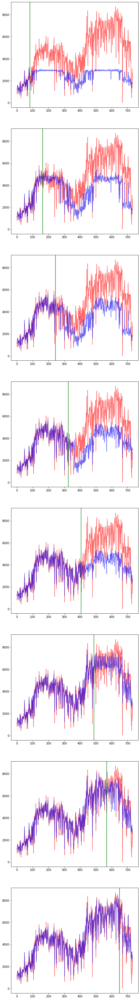

In [ ]:
# wizualizacja predykcji dla całego zbioru danych z widocznym podziałem danych uczących
y_real = data_day['cnt'].values
x = data_day['instant'].values
    
fig, ax = plt.subplots(len(models), figsize = (8, len(models) * 8) )
for i, model in enumerate(models):
    x_pred = data_day.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = model.predict(x_pred)
    ax[i].plot(x, y_real, color='red', alpha=0.6)
    ax[i].plot(x, y_pred, color='blue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='green', label='axvline - full height')

In [ ]:
pickle.dump(models[-3], open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_RFOREST.sav', 'wb'))

# Model MLP (dziennie)

In [ ]:
# lista modeli mlp do późniejszego wyuczenia
nn_model = Sequential()
nn_model.add( Dense(38, input_dim=11,  activation='relu') )
nn_model.add( Dense(24, activation='relu') )
nn_model.add( Dense(24, activation='relu') )
nn_model.add( Dense(13, activation='relu') )
nn_model.add( Dense(1, activation='linear') )

nn_models = []
separation_index = []
for  train_index, test_index in timesplit.split(X_Y):
    nn_models.append( keras.models.clone_model(nn_model) )
    separation_index.append(train_index.max())

In [ ]:
rmse = []
mae = []
avg = []

for i, (train_index, test_index) in enumerate( timesplit.split(X_Y) ):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1), train['cnt']
    x_test, y_test = test.drop('cnt', axis=1), test['cnt']
    early_stop = EarlyStopping(monitor='val_loss', patience=25, mode='min')
    
    nn_models[i].compile(optimizer='adam', loss='mse')
    nn_models[i].fit(
                     x_train,
                     y_train.ravel(),
                     batch_size=16,
                     epochs = 6000,
                     verbose = 0,
                     validation_data=(x_test, y_test),
                     callbacks=[early_stop]
                    )
    y_pred = nn_models[i].predict(x_test)
    rmse.append( np.sqrt(mean_squared_error(y_test, y_pred)) )
    mae.append( mean_absolute_error(y_test, y_pred) )
    avg.append( np.mean(y_test.values) )
  
print( f'Dla trzeciego od końca modelu:\nrmse: {rmse[-3]}\nmae: {mae[-3]}\nśrednia ilość wyporzyczeń: {avg[-3]}') 
    

3/3 [==============================] - 0s 4ms/step


3/3 [==============================] - 0s 5ms/step


3/3 [==============================] - 0s 7ms/step
Dla trzeciego od końca modelu:
rmse: 1179.730903952015
mae: 966.4704680266203
średnia ilość wyporzyczeń: 6497.456790123457


23/23 [==============================] - 0s 1ms/step


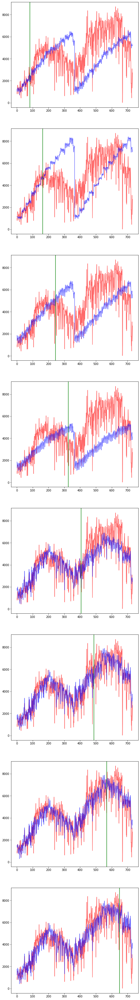

In [ ]:
# wizualizacja dopasowania dla zwiekszajacej sie proby uczacej gdzie linia pokazuje separacje danych
y_real = data_day['cnt'].values
x = data_day['instant'].values
    
fig, ax = plt.subplots(len(nn_models), figsize = (8, len(nn_models) * 8) )
for i, model in enumerate(nn_models):
    x_pred = data_day.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = model.predict(x_pred)
    ax[i].plot(x, y_real, color='red', alpha=0.6)
    ax[i].plot(x, y_pred, color='blue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='green', label='axvline - full height')

In [ ]:
nn_models[-3].save('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_MLP')

# Modele SVM (dziennie)

In [ ]:
# creating svm models for fitting
svm_models = []
# liniowe jądro w każdym przypadku było lepsze niż rbf
grid_param = { 'C':[1, 10, 100, 1000, 10000], 'gamma' : [1, 10, 100, 1000, 10000], 'epsilon' : [1, 0.9, 0.5, 0.1, 0.01, 0.001],  'kernel': ['rbf', 'linear']}

for train_index, test_index in timesplit.split(X_Y):
    svm_models.append( GridSearchCV(SVR(), grid_param, refit=True, verbose=True) )

In [ ]:
rmse = []
mae = []
avg = []
for i, (train_index, test_index) in enumerate( timesplit.split(X_Y) ):
    train = X_Y.iloc[train_index]
    test = X_Y.iloc[test_index]
    x_train, y_train = train.drop('cnt', axis=1).values, train['cnt'].values
    x_test, y_test = test.drop('cnt', axis=1).values, test['cnt'].values
    svm_models[i].fit(x_train, y_train)
    
    y_pred = svm_models[i].predict(x_test)
    rmse.append( np.sqrt(mean_squared_error(y_test, y_pred)) )
    mae.append( mean_absolute_error(y_test, y_pred) )
    avg.append( np.mean(y_test) )
    print(f"{i} model fitted")

print( f'Dla trzeciego od końca modelu:\nrmse: {rmse[-3]}\nmae: {mae[-3]}\nśrednia ilość wyporzyczeń: {avg[-3]}') 

Fitting 5 folds for each of 300 candidates, totalling 1500 fits
0 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
1 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
2 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
3 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
4 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
5 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
6 model fitted
Fitting 5 folds for each of 300 candidates, totalling 1500 fits
7 model fitted
Dla trzeciego od końca modelu:
rmse: 1201.5040832160432
mae: 981.9282993260099
średnia ilość wyporzyczeń: 6497.456790123457


In [ ]:
for mod in svm_models:
  print( mod.best_params_ )

{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 0.5, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 0.9, 'gamma': 1, 'kernel': 'linear'}
{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}


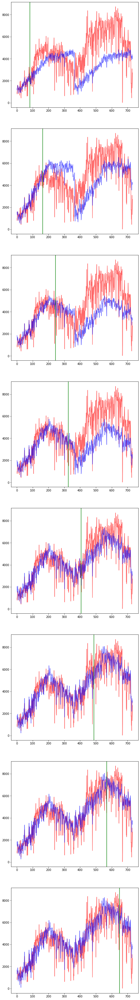

In [ ]:
y_real = data_day['cnt'].values
x = data_day['instant'].values
    
fig, ax = plt.subplots(len(svm_models), figsize = (8, len(svm_models) * 8) )
for i, model in enumerate(svm_models):
    x_pred = data_day.drop(['instant', 'dteday', 'cnt', 'casual', 'registered'], axis=1).values
    y_pred = svm_models[i].predict(x_pred)
    ax[i].plot(x, y_real, color='red', alpha=0.6)
    ax[i].plot(x, y_pred, color='blue', alpha=0.6)
    ax[i].axvline(x=separation_index[i], color='green', label='axvline - full height')

In [ ]:
# printing best params for svm_models
for model in svm_models:
  print(model.best_params_)

{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 0.5, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 10000, 'epsilon': 0.9, 'gamma': 1, 'kernel': 'linear'}
{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}
{'C': 1000, 'epsilon': 1, 'gamma': 1, 'kernel': 'linear'}


In [ ]:
pickle.dump(svm_models[-3], open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_SVM.sav', 'wb'))

# Analiza istotności dla wypożyczeń dziennych
Do analizy wybrałem ze wszystkich serii czasowych trzeci od końca ponieważ wydaje się wyłapywać trend dla 2 roku

In [ ]:
# biblioteki dla analizy
from SALib.analyze import morris
from SALib.analyze import sobol 
from SALib.sample import saltelli
import tensorflow as tf
import math

# rozbicie danych używając 3 od końca rozbicia dla serii czasowych
splits_indexes = []
for train_index, test_index in timesplit.split(X_Y):
  splits_indexes.append( [train_index, test_index] )
splits_indexes = splits_indexes[-3]

x_train = X_Y.iloc[splits_indexes[0]].drop('cnt', axis=1)
y_train = X_Y.iloc[splits_indexes[0]]['cnt']

x_test = X_Y.iloc[splits_indexes[1]].drop('cnt', axis=1)
y_test = X_Y.iloc[splits_indexes[1]]['cnt']

# wybranie 100 próbek do analizy shap
Ksamples = shap.sample(x_train, 100)

# określenie problemu dla analizy wrażliwości
bounds = [ [math.floor(c_data.min()), math.ceil(c_data.max())] for (c_name, c_data) in x_train.iteritems() ]
problem = {
    'num_vars' : 11,
    'names' : list(x_train.columns.values),
    'bounds' : bounds
}

# stworzenie danych do analizy wrażliwości po przestrzeni problemu
param_values = saltelli.sample(problem, 1024)

# funkcja resetująca wagi w modelu mlp na wartości losowe
def reinitialize(model):
    for l in model.layers:
        if hasattr(l,"kernel_initializer"):
            l.kernel.assign(l.kernel_initializer(tf.shape(l.kernel)))
        if hasattr(l,"bias_initializer"):
            l.bias.assign(l.bias_initializer(tf.shape(l.bias)))
        if hasattr(l,"recurrent_initializer"):
            l.recurrent_kernel.assign(l.recurrent_initializer(tf.shape(l.recurrent_kernel)))

# funkcja rysująca dopasowania najlepszych moedli i licząca średnie metryki dla kilku powtórzeń
def evaluate_models(features, models, params_for_model_fitting = {}, model_builder=None, amounts=10) -> None:
  '''
  funkcja mająca na celu wytrenować kolejny model z listy
  używając co iteracje nowego modelu i pomniejszonej liczby atrybutów.
  Na sam koniec wyrysowując dopasowanie modelu i 
  wypisując sqrt(mse) oraz mae
  '''

  # zbiór danych do odrzucania najmniej znaczącyh
  relief_x_train = x_train
  relief_x_test = x_test

  fig, axes = plt.subplots( len(features), figsize=(5, 70) )

  model_avg_scores = []

  for i, ax in enumerate(axes):
    # usunięcie kolejnego atrybutu
    if( i > 0 ):
      relief_x_train = relief_x_train.drop( features.index[i-1], axis=1 )
      relief_x_test = relief_x_test.drop( features.index[i-1], axis=1 )

    # wytrenowanie modelu k-krotnie i zebranie wartości błędu
    scores = [ ]
    best_score = math.inf
    best_model = None
    best_weights_for_mlp = None
    for dummie in range(amounts):
      print(f'Uczę {dummie}-ty model dla {len(relief_x_train.columns.values)} atrybutów')
      clear_output(wait=True)
      if (model_builder):
        models[i] = model_builder()
        models[i].fit(relief_x_train, y_train)
      else:
        reinitialize(models[i])
        models[i].fit(relief_x_train, y_train, **params_for_model_fitting)
      y_pred = models[i].predict(relief_x_test)
      score = np.sqrt(mean_squared_error(y_test, y_pred))
      mae = mean_absolute_error(y_test, y_pred)
      scores.append( [score, mae] )
      
      if ( score < best_score ):
        if(model_builder):
          best_model = models[i]
        else:
          best_weights_for_mlp = models[i].get_weights()
    
    # uśrednienie wyników dla wszystkich modeli
    model_avg_scores.append( np.mean(np.array(scores), axis=0) )

    # podmienienie modelu na najlepszy z wyuczonych
    if(model_builder):
      models[i] = best_model
    else:
      models[i].set_weights(best_weights_for_mlp)


    y_pred = models[i].predict(relief_x_test)
    # napis z metrykami
    text = f'sqrt(mse): {np.sqrt(mean_squared_error(y_test, y_pred)):0.4f}\nmae: {mean_absolute_error(y_test, y_pred):0.4f}'

    y_pred = models[i].predict(relief_x_test)
    ax.set_title( f'Wykres dopasowania\n{len(relief_x_train.columns.values)} atrybutów' )
    ax.plot( relief_x_test.index, y_pred, color='red' )
    ax.plot( relief_x_test.index, y_test, color='blue')
    ax.text( 0.3, 0.2, text, transform=ax.transAxes, size=13,)

  # wypisanie średnich wyników
  print( "########## AVG SCORES ########")
  for avg_s in model_avg_scores:
    print( f'avg rmse: {avg_s[0]:7.2f} | mae: {avg_s[1]:7.2f} ' )
  print( "########## AVG SCORES ########")


# klasy zwracające instancje modelów 
class dtree_builder:
  def __call__(self):
    return DecisionTreeRegressor()

class rforest_builder:
  def __call__(self):
    return RandomForestRegressor(n_estimators=500)

class svm_builder:
  def __call__(self):
    return SVR(**{'C': 10000, 'epsilon': 0.9, 'gamma': 1, 'kernel': 'linear'})

attributes_dict = {}
for i, attr in enumerate(x_train.columns.values):
  attributes_dict[attr] = str(i)
  print(f'{attr} : {i}')

`salib.sample.saltelli` will be removed in SALib 1.5. Please use `salib.sample.sobol`


season : 0
yr : 1
mnth : 2
holiday : 3
weekday : 4
workingday : 5
weathersit : 6
temp : 7
atemp : 8
hum : 9
windspeed : 10


# 0. Analiza RReliefF

In [ ]:
from sklearn_relief import RReliefF

In [ ]:
rel = RReliefF(n_features=20, n_iterations=300)
rel.fit( x_train.values, y_train.values )

RReliefF()

Text(0.5, 1.0, 'Wartości wag dla atrybutów')

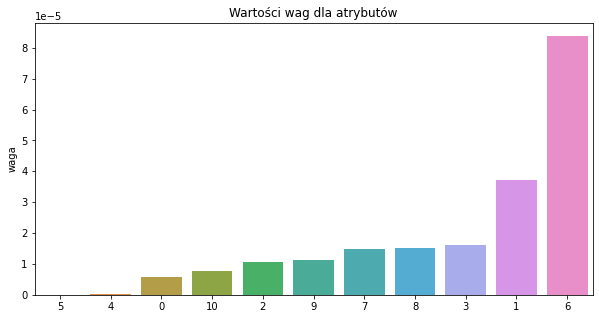

In [ ]:
features_relief = np.abs(rel.w_)
x_columns = x_train.columns

fig, ax = plt.subplots(figsize=(10, 5))
features_relief = pd.DataFrame(np.abs(features_relief.reshape(-1, 1)), index=x_columns, columns=['waga'])
features_relief.sort_values('waga', ascending=True, inplace=True)
attr_nums = [attributes_dict[att] for att in features_relief.index ]
sns.barplot(data=features_relief, x=attr_nums, y='waga')

'''
for i, p in enumerate(ax.patches):
    h, w, x = p.get_height(), p.get_width(), p.get_x()
    xy = (x + w / 2., h + 0.000001)
    value = features_relief.iloc[i].values[0]
    text = f'{value:0.2e}'
    ax.annotate(s=text, xy=xy, ha='center', va='center')
'''
ax.set_title('Wartości wag dla atrybutów')

Modele Drzewa Decyzyjnego

########## AVG SCORES ########
avg rmse: 1095.17 | mae:  850.96 
avg rmse: 1044.97 | mae:  816.93 
avg rmse: 1155.44 | mae:  935.17 
avg rmse: 1158.15 | mae:  935.83 
avg rmse: 1200.97 | mae:  957.71 
avg rmse: 1143.33 | mae:  879.45 
avg rmse: 1372.53 | mae:  967.46 
avg rmse: 1365.91 | mae:  951.75 
avg rmse: 2163.87 | mae: 1993.41 
avg rmse: 2166.84 | mae: 2005.61 
avg rmse: 2876.02 | mae: 2745.78 
########## AVG SCORES ########


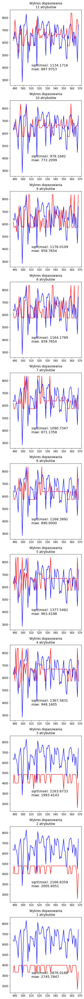

In [ ]:
dtree_models = []
for i in range(len(features_relief)):
  dtree_models.append( DecisionTreeRegressor() )

evaluate_models(features_relief, dtree_models, model_builder=dtree_builder(), amounts=10)

Modele Randomowych Lasów

########## AVG SCORES ########
avg rmse:  932.24 | mae:  743.14 
avg rmse:  936.28 | mae:  744.75 
avg rmse:  945.22 | mae:  748.90 
avg rmse:  946.15 | mae:  746.11 
avg rmse: 1019.35 | mae:  785.25 
avg rmse: 1053.51 | mae:  798.21 
avg rmse: 1085.20 | mae:  820.31 
avg rmse: 1059.09 | mae:  798.08 
avg rmse: 2158.53 | mae: 1989.43 
avg rmse: 2164.07 | mae: 2003.77 
avg rmse: 2874.73 | mae: 2744.46 
########## AVG SCORES ########


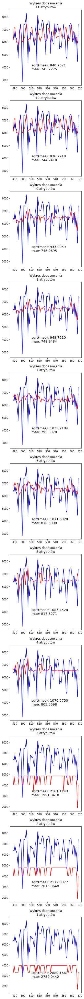

In [ ]:
rforest_models = []
for i in range(len(features_relief)):
  rforest_models.append( RandomForestRegressor(n_estimators=800) )

evaluate_models(features_relief, rforest_models, model_builder=rforest_builder(), amounts=10)

Modele MLP

3/3 [==============================] - 0s 4ms/step
########## AVG SCORES ########
avg rmse: 1212.16 | mae:  925.52 
avg rmse: 1174.97 | mae:  885.90 
avg rmse: 1154.28 | mae:  892.91 
avg rmse: 1280.33 | mae:  967.79 
avg rmse: 1228.31 | mae:  946.80 
avg rmse: 1079.83 | mae:  847.81 
avg rmse: 1134.83 | mae:  889.61 
avg rmse: 1110.42 | mae:  878.57 
avg rmse: 2158.16 | mae: 1992.87 
avg rmse: 2164.08 | mae: 2002.64 
avg rmse: 2888.24 | mae: 2756.60 
########## AVG SCORES ########


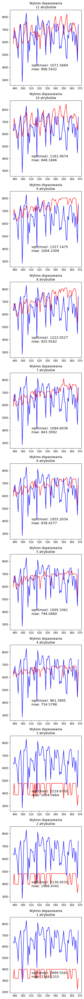

In [ ]:
# stworzenie n modeli mlp
early_stop = EarlyStopping(monitor='loss', patience=25, mode='min')
mlp_models = []
for i in range(len(features_relief)):
  mlp_model_t = Sequential()
  mlp_model_t.add( Dense(38, input_dim=len(features_relief)-i,  activation='relu') )
  mlp_model_t.add( Dense(24, activation='relu') )
  mlp_model_t.add( Dense(24, activation='relu') )
  mlp_model_t.add( Dense(13, activation='relu') )
  mlp_model_t.add( Dense(1, activation='linear') )
  mlp_models.append(mlp_model_t)
  mlp_models[-1].compile(loss='mse', optimizer='adam')

params_for_model_fitting = {'verbose':0, 'epochs':6000, 'batch_size':16, 'callbacks':[early_stop] }

evaluate_models(features_relief, mlp_models, params_for_model_fitting=params_for_model_fitting, amounts=10)

Modele SVM

########## AVG SCORES ########
avg rmse: 1201.49 | mae:  981.91 
avg rmse: 1186.62 | mae:  968.13 
avg rmse: 1194.28 | mae:  974.03 
avg rmse: 1135.85 | mae:  941.02 
avg rmse: 1129.86 | mae:  931.22 
avg rmse: 1178.24 | mae:  973.08 
avg rmse: 1179.65 | mae:  977.20 
avg rmse: 1179.79 | mae:  977.65 
avg rmse: 2277.89 | mae: 2114.15 
avg rmse: 2247.71 | mae: 2086.62 
avg rmse: 2641.80 | mae: 2500.58 
########## AVG SCORES ########


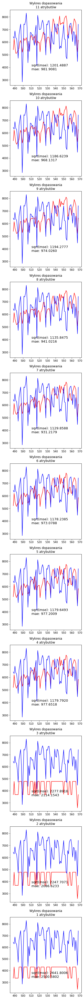

In [ ]:
svm_models = []
for i in range( len(features_relief) ):
  svm_models.append( SVR(C=10000, epsilon=1, gamma=1, kernel='linear') )

evaluate_models(features_relief, svm_models, model_builder=svm_builder(), amounts=1)

# 1. Model Drzewa decyzyjnego

Shap

In [ ]:
dtree_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_DTREE.sav', 'rb'))

In [ ]:
dtree_shap_values = shap.TreeExplainer(dtree_model, Ksamples).shap_values(Ksamples)

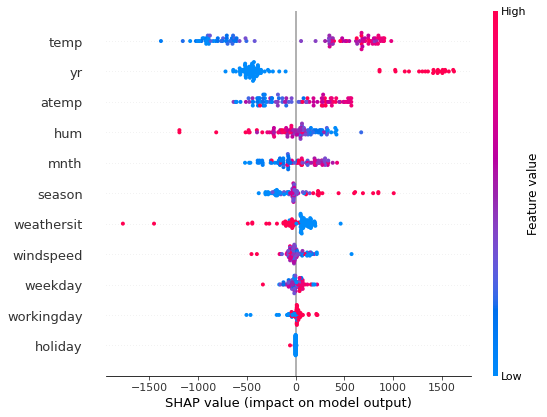

In [ ]:
shap.summary_plot(dtree_shap_values, Ksamples)

In [ ]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(dtree_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

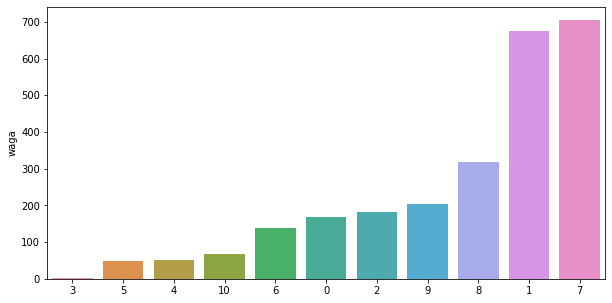

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1068.41 | mae:  824.38 
avg rmse: 1047.18 | mae:  823.59 
avg rmse: 1114.23 | mae:  852.24 
avg rmse: 1161.11 | mae:  938.37 
avg rmse: 1188.68 | mae: 1007.13 
avg rmse: 1249.20 | mae: 1059.61 
avg rmse: 1225.20 | mae:  984.79 
avg rmse: 1227.70 | mae:  956.77 
avg rmse: 1138.47 | mae:  866.98 
avg rmse: 1222.13 | mae:  919.20 
avg rmse: 2355.82 | mae: 2080.17 
########## AVG SCORES ########


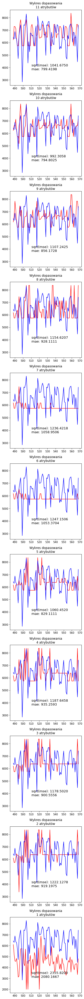

In [ ]:
dtree_models = []
for i in range( len(shap_importance) ):
  dtree_models.append( DecisionTreeRegressor() )

evaluate_models(shap_importance, dtree_models, model_builder=dtree_builder(), amounts=10)

Morris

In [ ]:
Y = dtree_model.predict(param_values)

<Figure size 1440x2880 with 0 Axes>

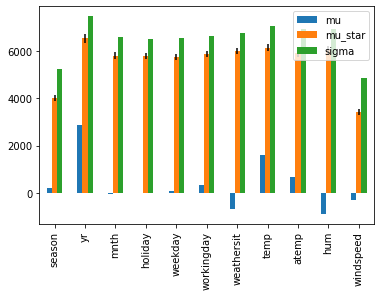

In [ ]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

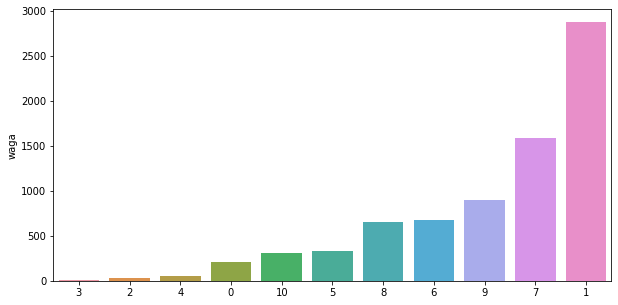

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index ]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1026.48 | mae:  807.45 
avg rmse: 1065.27 | mae:  828.20 
avg rmse: 1056.73 | mae:  821.29 
avg rmse: 1145.52 | mae:  914.01 
avg rmse: 1147.86 | mae:  912.07 
avg rmse: 1134.26 | mae:  871.80 
avg rmse: 1161.45 | mae:  891.18 
avg rmse: 1398.70 | mae: 1090.00 
avg rmse: 1448.31 | mae: 1131.03 
avg rmse: 1222.13 | mae:  919.20 
avg rmse: 2252.67 | mae: 2071.21 
########## AVG SCORES ########


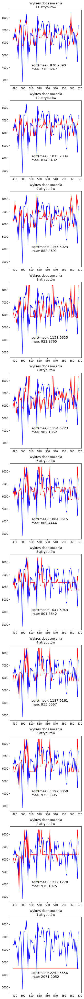

In [ ]:
evaluate_models(features_morris, dtree_models, model_builder=dtree_builder(), amounts=10)

Analiza metodą Sobol

In [ ]:
Si = sobol.analyze(problem, Y)

In [ ]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                waga
holiday     0.000944
weekday     0.022370
mnth        0.030219
workingday  0.045808
season      0.046792
windspeed   0.064897
weathersit  0.116430
hum         0.162369
atemp       0.201375
temp        0.372631
yr          0.623379


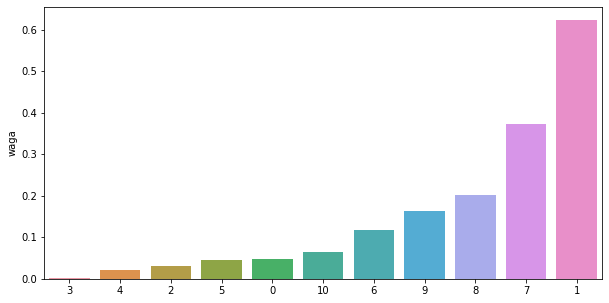

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index ]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1069.36 | mae:  826.74 
avg rmse: 1048.15 | mae:  821.09 
avg rmse: 1143.73 | mae:  907.86 
avg rmse: 1141.55 | mae:  903.71 
avg rmse: 1155.04 | mae:  933.92 
avg rmse: 1162.41 | mae:  941.25 
avg rmse: 1212.59 | mae:  936.99 
avg rmse: 1175.08 | mae:  923.63 
avg rmse: 1137.98 | mae:  871.34 
avg rmse: 1222.13 | mae:  919.20 
avg rmse: 2252.67 | mae: 2071.21 
########## AVG SCORES ########


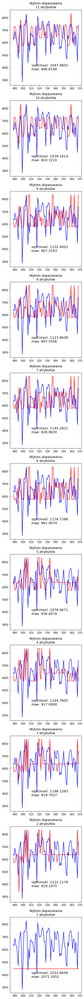

In [ ]:
evaluate_models(features_sobol, dtree_models, model_builder=dtree_builder(), amounts=10)

# 2. Model Randomowych lasów


In [ ]:
rforest_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_RFOREST.sav', 'rb'))

In [ ]:
rforest_shap_values = shap.TreeExplainer(rforest_model, Ksamples).shap_values(Ksamples)

 92%|==================  | 92/100 [00:12<00:01]       

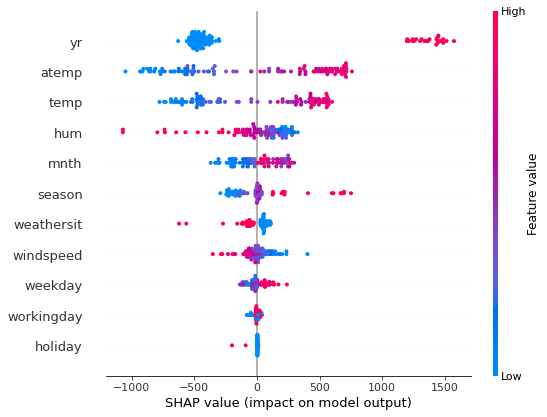

In [ ]:
shap.summary_plot(rforest_shap_values, Ksamples, feature_names=x_train.columns)

In [ ]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(rforest_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                 waga
name                 
holiday      5.809565
workingday  14.459217
weekday     50.581013
windspeed   73.257170
weathersit  76.694239


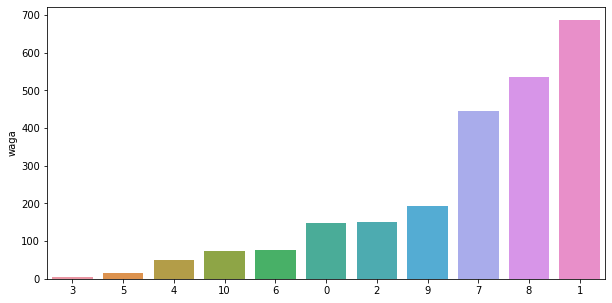

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:  933.98 | mae:  743.05 
avg rmse:  932.62 | mae:  743.70 
avg rmse:  934.38 | mae:  741.85 
avg rmse:  947.05 | mae:  750.00 
avg rmse: 1020.00 | mae:  791.28 
avg rmse: 1023.76 | mae:  804.66 
avg rmse: 1022.82 | mae:  799.29 
avg rmse: 1031.51 | mae:  794.03 
avg rmse: 1044.52 | mae:  807.99 
avg rmse:  991.96 | mae:  771.83 
avg rmse: 2253.83 | mae: 2072.37 
########## AVG SCORES ########


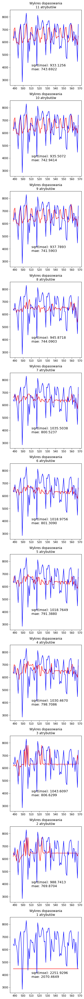

In [ ]:
rforest_models = []
for i in range( len(shap_importance) ):
  rforest_models.append( RandomForestRegressor(n_estimators=500) )

evaluate_models(shap_importance, rforest_models, model_builder=rforest_builder(), amounts=10)

Analiza metodą Morris

In [ ]:
Y = rforest_model.predict(param_values)

<Figure size 1440x2880 with 0 Axes>

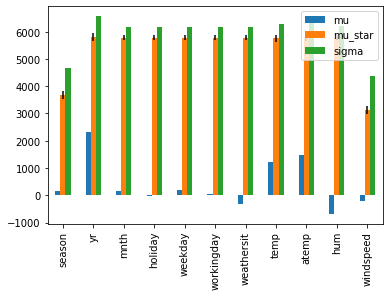

In [ ]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

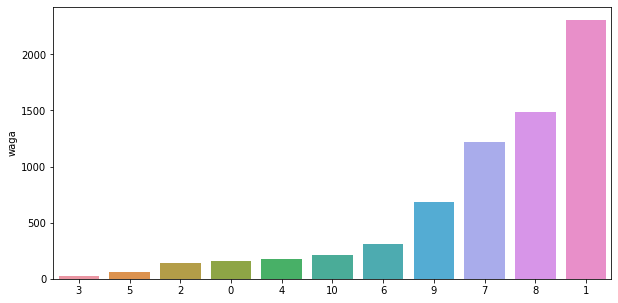

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index ]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:  936.77 | mae:  746.57 
avg rmse:  933.22 | mae:  742.96 
avg rmse:  934.91 | mae:  743.61 
avg rmse:  937.77 | mae:  738.43 
avg rmse:  945.50 | mae:  747.41 
avg rmse:  957.43 | mae:  746.82 
avg rmse: 1044.89 | mae:  794.79 
avg rmse: 1034.18 | mae:  797.46 
avg rmse: 1042.06 | mae:  805.95 
avg rmse:  992.29 | mae:  771.46 
avg rmse: 2256.02 | mae: 2074.57 
########## AVG SCORES ########


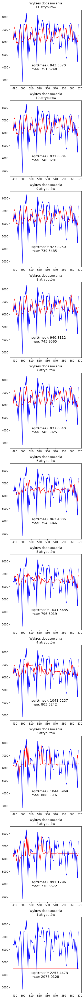

In [ ]:
evaluate_models(features_morris, rforest_models, model_builder=rforest_builder(), amounts=10)

Analiza metodą Sobol

In [ ]:
Si = sobol.analyze(problem, Y)

In [ ]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                waga
holiday     0.000655
workingday  0.000923
mnth        0.005598
weekday     0.010420
season      0.010747
weathersit  0.013525
windspeed   0.015934
hum         0.052103
temp        0.162344
atemp       0.243709
yr          0.566389


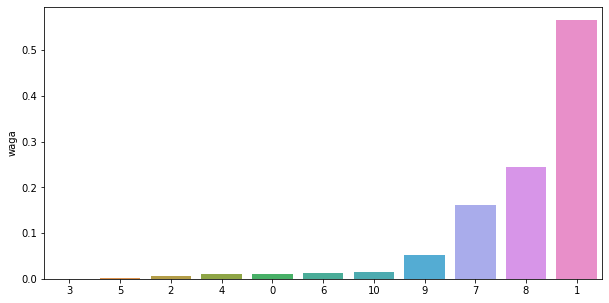

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index ]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse:  934.88 | mae:  743.87 
avg rmse:  936.86 | mae:  744.59 
avg rmse:  936.50 | mae:  744.17 
avg rmse:  938.17 | mae:  737.53 
avg rmse:  943.49 | mae:  735.33 
avg rmse:  957.32 | mae:  746.76 
avg rmse:  956.31 | mae:  753.75 
avg rmse: 1031.82 | mae:  796.39 
avg rmse: 1043.43 | mae:  807.11 
avg rmse:  991.82 | mae:  770.84 
avg rmse: 2254.68 | mae: 2073.23 
########## AVG SCORES ########


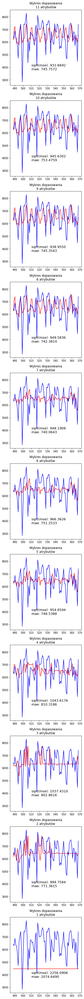

In [ ]:
evaluate_models(features_sobol, rforest_models, model_builder=rforest_builder(), amounts=10)

# 3. Model MLP

In [ ]:
mlp_model = keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_MLP')

In [ ]:
mlp_shap_values = shap.KernelExplainer(mlp_model.predict, Ksamples).shap_values(Ksamples)

4/4 [==============================] - 0s 3ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

6394/6394 [==============================] - 8s 1ms/step


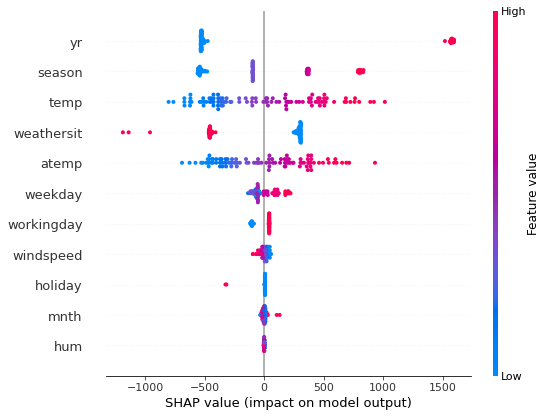

In [ ]:
shap.summary_plot(mlp_shap_values[0], Ksamples, feature_names=x_train.columns)

In [ ]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(mlp_shap_values[0], columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                 waga
name                 
hum          1.155284
mnth        11.021686
holiday     12.856413
windspeed   24.047801
workingday  59.043004


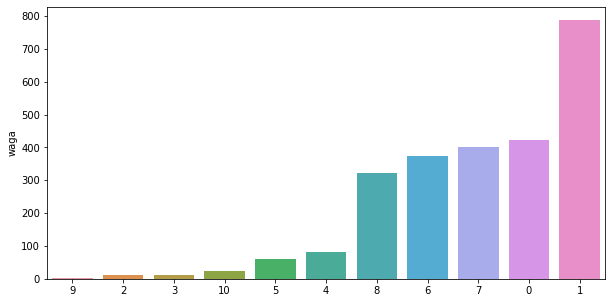

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

3/3 [==============================] - 0s 4ms/step
########## AVG SCORES ########
avg rmse: 1213.66 | mae:  914.14 
avg rmse: 1148.99 | mae:  869.51 
avg rmse: 1259.80 | mae:  965.08 
avg rmse: 1242.71 | mae:  960.26 
avg rmse: 1159.84 | mae:  872.16 
avg rmse: 1336.86 | mae: 1019.90 
avg rmse: 1253.27 | mae:  993.45 
avg rmse: 1354.93 | mae: 1064.44 
avg rmse: 1324.87 | mae: 1063.95 
avg rmse: 1604.38 | mae: 1382.07 
avg rmse: 2245.35 | mae: 2063.85 
########## AVG SCORES ########


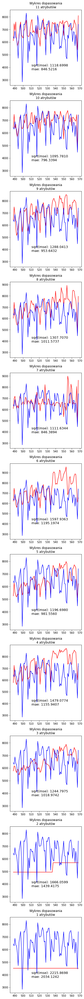

In [ ]:
def create_mlp(in_dim):
  nn_model = Sequential()
  nn_model.add( Dense(38, input_dim=in_dim,  activation='relu') )
  nn_model.add( Dense(24, activation='relu') )
  nn_model.add( Dense(24, activation='relu') )
  nn_model.add( Dense(13, activation='relu') )
  nn_model.add( Dense(1, activation='linear') )
  nn_model.compile(optimizer='adam', loss='mse')
  return nn_model
  
early_stop = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':6000, 'batch_size':16, 'callbacks': [early_stop]}

mlp_models = []
for i in range( len(shap_importance) ):
  mlp_models.append( create_mlp( len(shap_importance)-i ) )

evaluate_models(shap_importance, mlp_models, params_for_model_fitting=params_for_model_fitting, amounts=10)

Analiza metodą Morris

In [ ]:
Y = mlp_model.predict(param_values)

768/768 [==============================] - 1s 1ms/step


<Figure size 1440x2880 with 0 Axes>

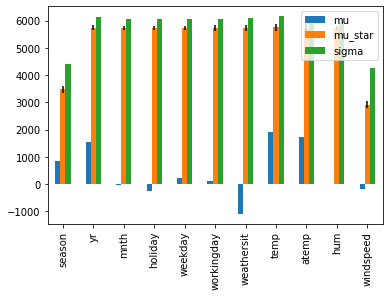

In [ ]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

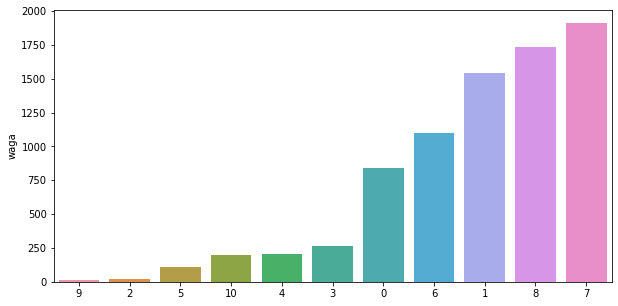

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index ]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

3/3 [==============================] - 0s 5ms/step
########## AVG SCORES ########
avg rmse: 1107.02 | mae:  831.79 
avg rmse: 1245.66 | mae:  946.46 
avg rmse: 1374.63 | mae: 1035.18 
avg rmse: 1391.62 | mae: 1063.73 
avg rmse: 1310.42 | mae:  988.56 
avg rmse: 1271.37 | mae:  983.25 
avg rmse: 1181.76 | mae:  913.86 
avg rmse: 1126.95 | mae:  892.30 
avg rmse: 1320.10 | mae: 1033.21 
avg rmse: 2113.75 | mae: 1912.88 
avg rmse: 2078.18 | mae: 1850.94 
########## AVG SCORES ########


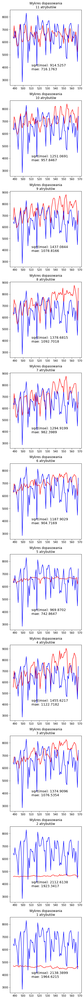

In [ ]:
evaluate_models(features_morris, mlp_models, params_for_model_fitting=params_for_model_fitting, amounts=10)

Analiza metodą Sobol

In [ ]:
def create_mlp(in_dim):
  nn_model = Sequential()
  nn_model.add( Dense(38, input_dim=in_dim,  activation='relu') )
  nn_model.add( Dense(24, activation='relu') )
  nn_model.add( Dense(24, activation='relu') )
  nn_model.add( Dense(13, activation='relu') )
  nn_model.add( Dense(1, activation='linear') )
  nn_model.compile(optimizer='adam', loss='mse')
  return nn_model
  
early_stop = EarlyStopping(monitor='loss', patience=25, mode='min')
params_for_model_fitting = {'verbose':0, 'epochs':6000, 'batch_size':16, 'callbacks': [early_stop]}

mlp_models = []
for i in range( len(shap_importance) ):
  mlp_models.append( create_mlp( len(shap_importance)-i ) )

In [ ]:
Y = Y.ravel()
Si = sobol.analyze(problem, Y)

In [ ]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                waga
hum         0.000012
mnth        0.000413
workingday  0.001127
weekday     0.003722
holiday     0.005836
windspeed   0.007490
season      0.089635
weathersit  0.103599
yr          0.206224
atemp       0.264209
temp        0.322715


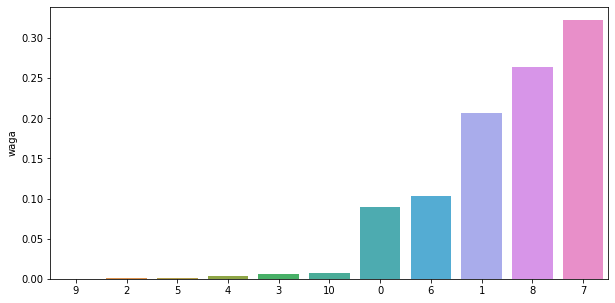

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index ]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

3/3 [==============================] - 0s 4ms/step
########## AVG SCORES ########
avg rmse: 1174.22 | mae:  893.35 
avg rmse: 1239.77 | mae:  939.15 
avg rmse: 1289.20 | mae:  979.90 
avg rmse: 1375.55 | mae: 1047.14 
avg rmse: 1282.87 | mae:  990.40 
avg rmse: 1218.82 | mae:  957.79 
avg rmse: 1170.77 | mae:  921.96 
avg rmse: 1118.31 | mae:  889.18 
avg rmse: 1301.35 | mae: 1024.38 
avg rmse: 2112.41 | mae: 1913.31 
avg rmse: 2068.82 | mae: 1827.82 
########## AVG SCORES ########


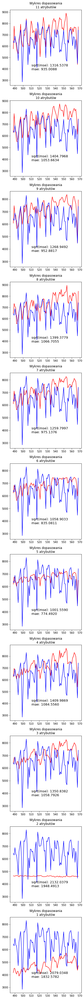

In [ ]:
evaluate_models(features_sobol, mlp_models, params_for_model_fitting=params_for_model_fitting, amounts=10)

# 4. Model SVM

Analiza metodą Shap

In [ ]:
svm_model = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/models/BikeModels/Bike_SVM.sav', 'rb'))

In [ ]:
svm_shap_values = shap.KernelExplainer(svm_model.predict, Ksamples).shap_values(Ksamples)

  0%|          | 0/100 [00:00<?, ?it/s]

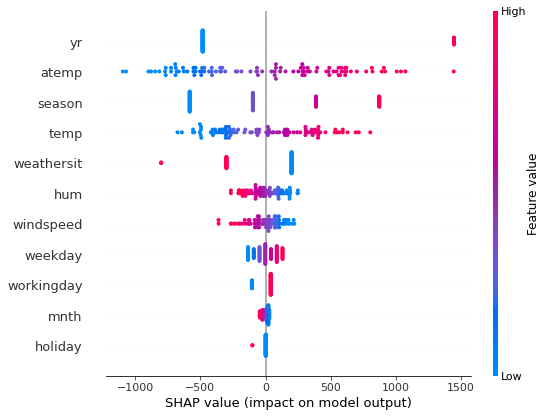

In [ ]:
shap.summary_plot(svm_shap_values, Ksamples, feature_names=x_train.columns)

In [ ]:
feature_names = x_train.columns
shap_values_df = pd.DataFrame(svm_shap_values, columns = feature_names )

vals = np.abs(shap_values_df.values).mean(0)
shap_importance = pd.DataFrame( list(zip(feature_names, vals)), columns = ['name', 'waga'] )
shap_importance.sort_values('waga', ascending=True, inplace=True)
shap_importance.set_index('name', inplace=True)

print(shap_importance.head())

                 waga
name                 
holiday      4.022359
mnth        19.439120
workingday  58.368428
weekday     69.993767
windspeed   93.929122


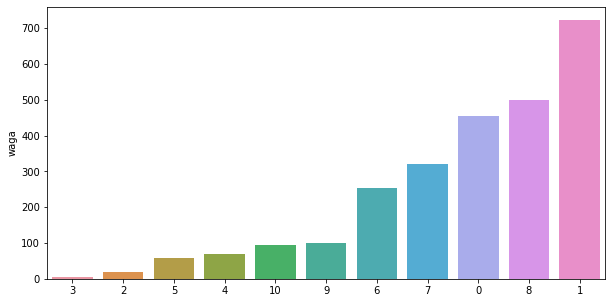

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in shap_importance.index ]
sns.barplot(data=shap_importance, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1201.50 | mae:  981.93 
avg rmse: 1203.48 | mae:  986.42 
avg rmse: 1199.99 | mae:  981.32 
avg rmse: 1192.41 | mae:  973.72 
avg rmse: 1202.68 | mae:  982.99 
avg rmse: 1196.15 | mae:  985.26 
avg rmse: 1194.04 | mae:  985.74 
avg rmse: 1226.59 | mae: 1014.73 
avg rmse: 1220.07 | mae: 1011.28 
avg rmse: 1207.25 | mae: 1006.06 
avg rmse: 2394.98 | mae: 2217.65 
########## AVG SCORES ########


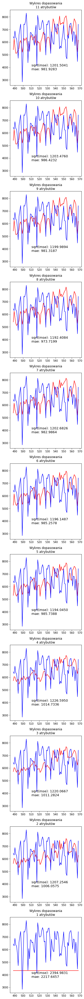

In [ ]:
svm_models = []
for i in range( len(shap_importance) ):
  svm_models.append( 0 )

evaluate_models(shap_importance, svm_models, model_builder=svm_builder(), amounts=1)

Analiza metodą Morris

In [ ]:
Y = svm_model.predict(param_values)

<Figure size 1440x2880 with 0 Axes>

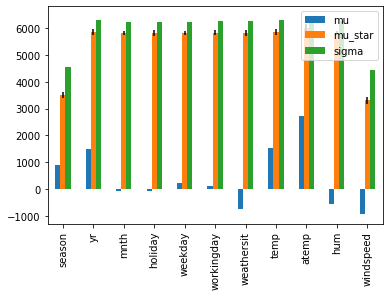

In [ ]:
Si = morris.analyze(problem, param_values, Y)
plt.figure( figsize=(20, 40))
Si.plot()

features_morris = pd.DataFrame( np.abs(Si['mu']), columns=['waga'], index=Si['names'] )
features_morris.sort_values('waga', ascending=True, inplace=True)

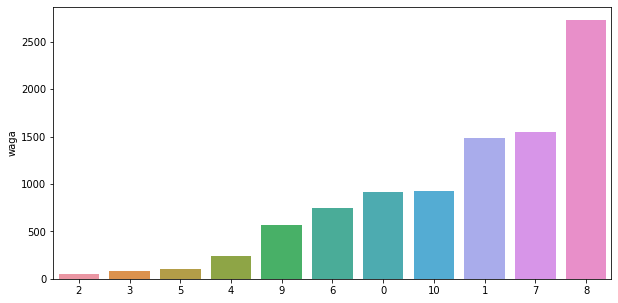

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_morris.index ]
sns.barplot(data=features_morris, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1201.50 | mae:  981.93 
avg rmse: 1197.14 | mae:  977.88 
avg rmse: 1199.99 | mae:  981.32 
avg rmse: 1192.41 | mae:  973.72 
avg rmse: 1202.68 | mae:  982.99 
avg rmse: 1198.89 | mae:  990.71 
avg rmse: 1223.85 | mae: 1012.27 
avg rmse: 1212.79 | mae: 1008.74 
avg rmse: 1208.01 | mae: 1005.98 
avg rmse: 2102.47 | mae: 1867.36 
avg rmse: 2108.93 | mae: 1872.47 
########## AVG SCORES ########


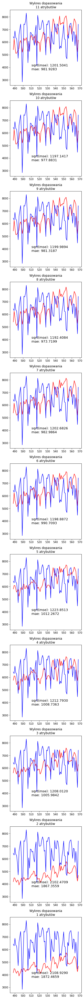

In [ ]:
evaluate_models(features_morris, svm_models, model_builder=svm_builder(), amounts=1)

Analiza metodą Sobol

In [ ]:
Si = sobol.analyze(problem, Y)

In [ ]:
features_sobol = pd.DataFrame( np.abs(Si['ST']), columns=['waga'], index=problem['names'] )
features_sobol.sort_values('waga', ascending=True, inplace=True)
print(features_sobol)

                waga
mnth        0.000194
holiday     0.000382
workingday  0.000761
weekday     0.002539
hum         0.022116
weathersit  0.036345
season      0.076677
windspeed   0.088630
yr          0.134841
temp        0.155750
atemp       0.481667


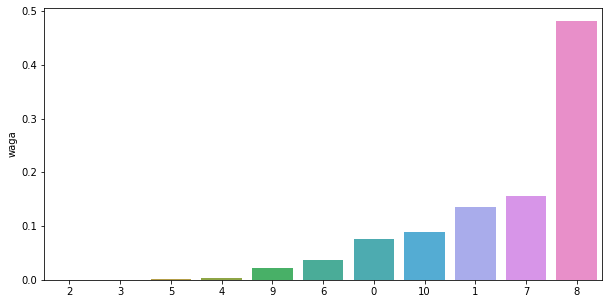

In [ ]:
plt.figure( figsize=(10, 5))
plt.tight_layout()
attr_nums = [attributes_dict[att] for att in features_sobol.index ]
sns.barplot(data=features_sobol, y='waga', x=attr_nums)

########## AVG SCORES ########
avg rmse: 1201.50 | mae:  981.93 
avg rmse: 1197.14 | mae:  977.88 
avg rmse: 1199.99 | mae:  981.32 
avg rmse: 1192.41 | mae:  973.72 
avg rmse: 1202.68 | mae:  982.99 
avg rmse: 1198.89 | mae:  990.71 
avg rmse: 1223.85 | mae: 1012.27 
avg rmse: 1212.79 | mae: 1008.74 
avg rmse: 1208.01 | mae: 1005.98 
avg rmse: 2102.47 | mae: 1867.36 
avg rmse: 2108.93 | mae: 1872.47 
########## AVG SCORES ########


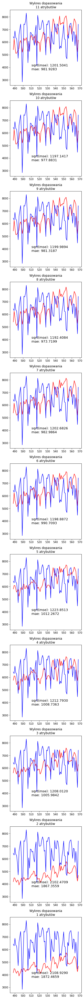

In [ ]:
evaluate_models(features_sobol, svm_models, model_builder=svm_builder(), amounts=1)